In [22]:
%matplotlib inline 
import os
import ee
from ee import batch
import time
import requests
import zipfile
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
import rasterio as rio
from rasterio.windows import from_bounds, Window
from rasterio.warp import reproject
from rasterio.enums import Resampling, ColorInterp
import datetime
import pandas as pd
import matplotlib
import matplotlib.patches as mpatches
from matplotlib.colors import LightSource
# from cmcrameri import cm as cmc
from mpl_toolkits.axes_grid1 import make_axes_locatable
from IPython.display import Image, display

# Uncomment to trigger the authentication flow, if needed
# ee.Authenticate()

# Initialize the library
ee.Initialize()

In [31]:
doline001amery = {'lat': -72.36174,
                  'lon': 67.65076,
                  # 'date': '2020-02-07',
                  'buffer': 7000,
                  # 'nScenes': 1,
                  'name': 'doline001',
                  'print_info': True,
                  'show_plots': True,
                  # 'fig_folder': 'data/REMA_ee_downloads_figs/',
                  'location_description': 'Amery Ice Shelf'}

doline005george = {'lat': -71.62475,
                  'lon': -67.58556,
                  # 'date': '2020-02-07',
                  'buffer': 7000,
                  # 'nScenes': 1,
                  'name': 'doline005',
                  'print_info': True,
                  'show_plots': True,
                  # 'fig_folder': 'data/REMA_ee_downloads_figs/',
                  'location_description': 'George VI Ice Shelf'}

doline006amery = {'lat': -72.03536,
                  'lon': 69.57317,
                  # 'date': '2020-02-07',
                  'buffer': 3000,
                  # 'nScenes': 1,
                  'name': 'doline006',
                  'print_info': True,
                  'show_plots': False,
                  # 'fig_folder': 'data/REMA_ee_downloads_figs/',
                  'location_description': 'Amery Ice Shelf'}

In [32]:
params = doline006amery

In [33]:
center_lat = params['lat']                        # latitude to query for
center_lon = params['lon']                        # longitude to query for
# date_requested = params['date']                   # point in time to query for
buffer_around_center_meters = params['buffer']    # how much area to request around the queried point
# n_scenes_before_after = params['nScenes']         # how many scenes to request before and after queried time
request_name = params['name']                     # prefix for file naming
print_info = params['print_info']                 # whether to show info on the output plots
show_plots = params['show_plots']                 # whether to show plots in the notebook
location = params['location_description']         # for figure labeling
# fig_dir = params['fig_folder']                    # folder for storing the produced figures
fig_dir = 'data/REMA_ee_downloads_figs/'

collection_name_rema2 = 'UMN/PGC/REMA/V1/2m'            # earth engine collection 2m resolution
collection_name_rema8 = 'UMN/PGC/REMA/V1/8m'            # earth engine collection 8m resolution
# https://developers.google.com/earth-engine/datasets/catalog/COPERNICUS_S2_SR
# var rema2 = ee.ImageCollection('UMN/PGC/REMA/V1/2m');
# var rema8 = ee.ImageCollection("UMN/PGC/REMA/V1/8m");
# var rema = rema2.merge(rema8);

download_folder_scenes = 'data/REMA_ee_downloads/' # folder to store the unzipped scenes
download_folder_zip = 'data/tmp_downloads_zip/'    # folder to store zipped downloads in (can be deleted after running)

In [34]:
center_lonlat = [center_lon,center_lat]
poi = ee.Geometry.Point(center_lonlat[0],center_lonlat[1])
roi = poi.buffer(buffer_around_center_meters)
collection_merged = ee.ImageCollection(collection_name_rema2).merge(ee.ImageCollection(collection_name_rema8))
collection_bounds = collection_merged.filterBounds(roi)
n_imgs = collection_bounds.size().getInfo()
print('number of REMA strip files for location requested: %d' % n_imgs)

number of REMA strip files for location requested: 31


In [35]:
def maxval(image):
    elev = image.select('elevation')
    maxval_region = elev.reduceRegion(reducer = ee.Reducer.max(),
                               geometry = roi,
                               scale = 2,
                               maxPixels = 1e6,
                               bestEffort = True)
    image = image.set('max_in_region',maxval_region.get('elevation'))
    return image

maxval_tol = -9990
collection = collection_bounds.map(algorithm=maxval).filter(ee.Filter.gt('max_in_region', maxval_tol))
n_imgs = collection.size().getInfo()
print('number of REMA strip files with data inside region requested: %d' % n_imgs)

number of REMA strip files with data inside region requested: 19


In [36]:
# image = ee.Image('UMN/PGC/REMA/V1/2m/SETSM_WV01_20160112_102001004AA6A400_102001004A3D4400_seg1')
# band = image.select('elevation')
# poi = ee.Geometry.Point([-67.58556, -71.62475])
# roi = poi.buffer(3000)
# maxDictionary = band.reduceRegion(
#   reducer = ee.Reducer.max(),
#   geometry = roi,
#   scale = 2,
#   maxPixels = 1e9)
# image = image.set('maxval',maxDictionary.get('elevation'))
# maxDictionary.get('elevation').getInfo()
# image.getInfo()['properties']

In [37]:
info = collection.getInfo()
dateformat = '%Y-%m-%d'
times, timestrings, prodIDs, scenenames, crss, transforms, fns = [], [], [], [], [], [], []
for i in range(n_imgs):
    date_string = info['features'][i]['properties']['acqDate1']
    date_datetime = datetime.datetime.strptime(date_string,dateformat)
    timestrings.append(date_string)
    times.append(date_datetime)
    prodID = info['features'][i]['properties']['system:index']
    prodIDs.append(prodID)
    scenenames.append(info['features'][i]['id'])
    transforms.append(info['features'][i]['bands'][0]['crs_transform'])
    crss.append(info['features'][i]['bands'][0]['crs'])
    fns.append('REMA_%s_%s_%s.tiff' % (request_name, date_string, prodID))
scenedf = pd.DataFrame({'iScene': np.arange(n_imgs),
                       'date': times,
                       'product_id': prodIDs,
                       'crs_transform': transforms, 
                       'crs': crss,
                       'fn': fns,
                       'scene_name': scenenames,
                       'date_string': timestrings})
scenedf.sort_values(by='date', inplace=True)
scenedf

,iScene,date,product_id,crs_transform,crs,fn,scene_name,date_string
4,4,2011-12-27,2_SETSM_WV01_20111227_10200100190CE100_1020010...,"[8, 0, 1813984, 0, -8, 722192]","PROJCS[""unnamed"", \n GEOGCS[""WGS 84"", \n D...",REMA_doline006_2011-12-27_2_SETSM_WV01_2011122...,UMN/PGC/REMA/V1/8m/SETSM_WV01_20111227_1020010...,2011-12-27
5,5,2011-12-31,2_SETSM_WV01_20111231_102001001823D500_1020010...,"[8, 0, 1813616, 0, -8, 722688]","PROJCS[""unnamed"", \n GEOGCS[""WGS 84"", \n D...",REMA_doline006_2011-12-31_2_SETSM_WV01_2011123...,UMN/PGC/REMA/V1/8m/SETSM_WV01_20111231_1020010...,2011-12-31
3,3,2012-03-13,2_SETSM_W1W1_20120313_1020010018607600_1020010...,"[8, 0, 1809600, 0, -8, 725488]","PROJCS[""unnamed"", \n GEOGCS[""WGS 84"", \n D...",REMA_doline006_2012-03-13_2_SETSM_W1W1_2012031...,UMN/PGC/REMA/V1/8m/SETSM_W1W1_20120313_1020010...,2012-03-13
6,6,2012-03-18,2_SETSM_WV01_20120318_102001001BB38E00_1020010...,"[8, 0, 1810424, 0, -8, 726608]","PROJCS[""unnamed"", \n GEOGCS[""WGS 84"", \n D...",REMA_doline006_2012-03-18_2_SETSM_WV01_2012031...,UMN/PGC/REMA/V1/8m/SETSM_WV01_20120318_1020010...,2012-03-18
9,9,2012-12-07,2_SETSM_WV02_20121207_103001001D7FB600_1030010...,"[8, 0, 1740728, 0, -8, 690768]","PROJCS[""unnamed"", \n GEOGCS[""WGS 84"", \n D...",REMA_doline006_2012-12-07_2_SETSM_WV02_2012120...,UMN/PGC/REMA/V1/8m/SETSM_WV02_20121207_1030010...,2012-12-07
10,10,2014-02-11,2_SETSM_WV02_20140211_103001002CC92100_1030010...,"[8, 0, 1740256, 0, -8, 689560]","PROJCS[""unnamed"", \n GEOGCS[""WGS 84"", \n D...",REMA_doline006_2014-02-11_2_SETSM_WV02_2014021...,UMN/PGC/REMA/V1/8m/SETSM_WV02_20140211_1030010...,2014-02-11
11,11,2014-02-16,2_SETSM_WV02_20140216_103001002C83C400_1030010...,"[8, 0, 1777536, 0, -8, 698776]","PROJCS[""unnamed"", \n GEOGCS[""WGS 84"", \n D...",REMA_doline006_2014-02-16_2_SETSM_WV02_2014021...,UMN/PGC/REMA/V1/8m/SETSM_WV02_20140216_1030010...,2014-02-16
0,0,2014-02-16,1_SETSM_WV01_20140216_1020010029D82A00_1020010...,"[2, 0, 1745078, 0, -2, 708934]","PROJCS[""unnamed"", \n GEOGCS[""WGS 84"", \n D...",REMA_doline006_2014-02-16_1_SETSM_WV01_2014021...,UMN/PGC/REMA/V1/2m/SETSM_WV01_20140216_1020010...,2014-02-16
12,12,2014-02-19,2_SETSM_WV02_20140219_103001002DA1EB00_1030010...,"[8, 0, 1815008, 0, -8, 698376]","PROJCS[""unnamed"", \n GEOGCS[""WGS 84"", \n D...",REMA_doline006_2014-02-19_2_SETSM_WV02_2014021...,UMN/PGC/REMA/V1/8m/SETSM_WV02_20140219_1030010...,2014-02-19
13,13,2014-03-02,2_SETSM_WV02_20140302_103001002EB86900_1030010...,"[8, 0, 1815080, 0, -8, 698656]","PROJCS[""unnamed"", \n GEOGCS[""WGS 84"", \n D...",REMA_doline006_2014-03-02_2_SETSM_WV02_2014030...,UMN/PGC/REMA/V1/8m/SETSM_WV02_20140302_1030010...,2014-03-02


In [38]:
print('downloaded scene (of %d)' % (len(scenedf.iScene)), end=' --> ')
for j, iScene in enumerate(scenedf.iScene):
    try:
        sceneName = scenedf.scene_name.iloc[j]
        thisScene = ee.Image(sceneName).reduceResolution(reducer = ee.Reducer.median(), maxPixels = 1024)
        fn = scenedf.fn.iloc[j]
        downloadURL = thisScene.getDownloadUrl({
                        'name': fn,
                        'bands': 'elevation',
                        'scale': 10,
                        #'crs': scenedf.crs.iloc[j],
                        #'crs_transform': scenedf.crs_transform.iloc[j],
                        'format': 'GEO_TIFF',
                        'region': roi})

        response = requests.get(downloadURL)

        if not os.path.exists(download_folder_scenes): os.makedirs(download_folder_scenes)
        with open(download_folder_scenes+fn, 'wb') as fd:
            fd.write(response.content)

#         with zipfile.ZipFile(download_folder_zip+fn+'.zip',"r") as zip_ref:
#             zip_ref.extractall(download_folder_scenes)

        print('%d'%(j+1),end=' ')

    except Exception as e:
        print(e)

print(' ')

downloaded scene (of 19) --> 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19  


  plotted scene (of 19) --> _____________________________________________________________________________

REMA_doline006_2011-12-27_2_SETSM_WV01_20111227_10200100190CE100_1020010018738D00_seg1.tiff


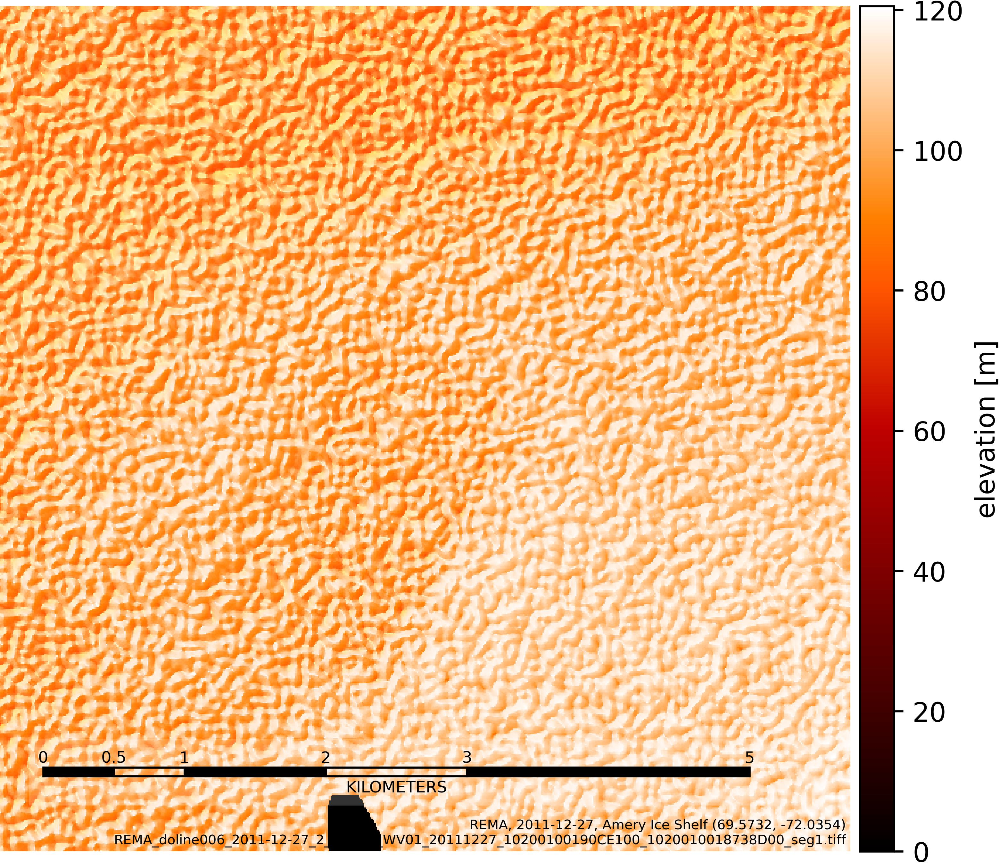

_____________________________________________________________________________

REMA_doline006_2011-12-31_2_SETSM_WV01_20111231_102001001823D500_1020010019057E00_seg1.tiff


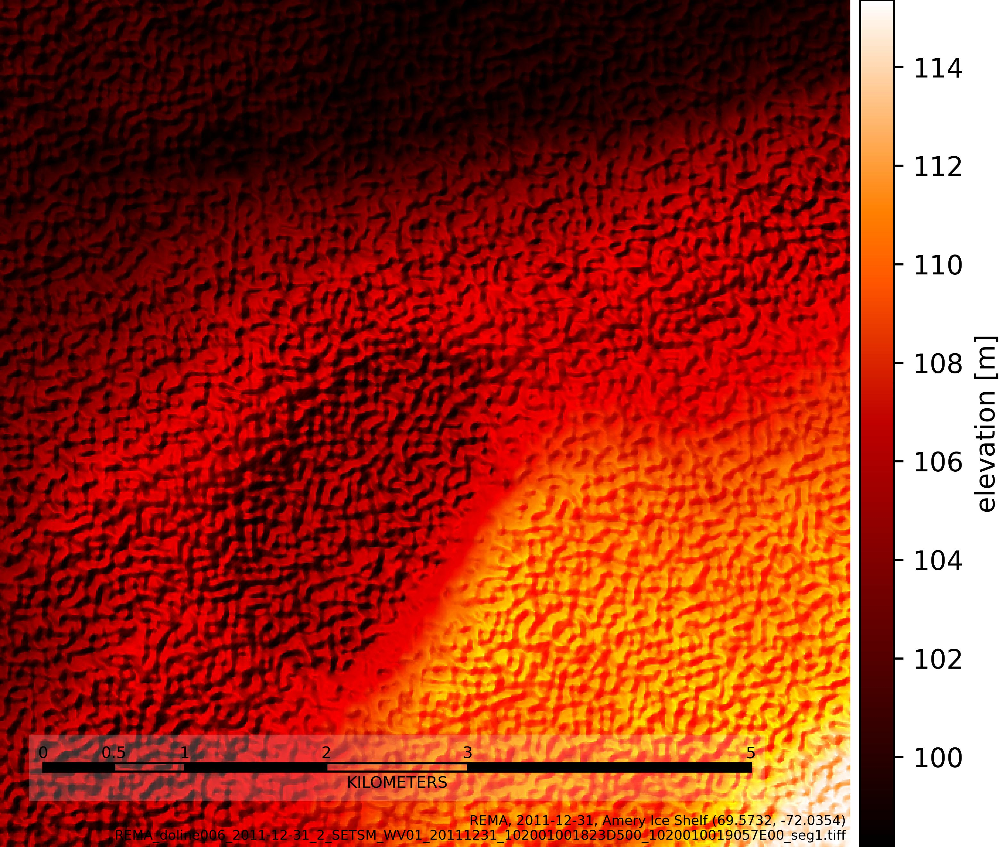

_____________________________________________________________________________

REMA_doline006_2012-03-13_2_SETSM_W1W1_20120313_1020010018607600_1020010018B6AF00_seg1.tiff


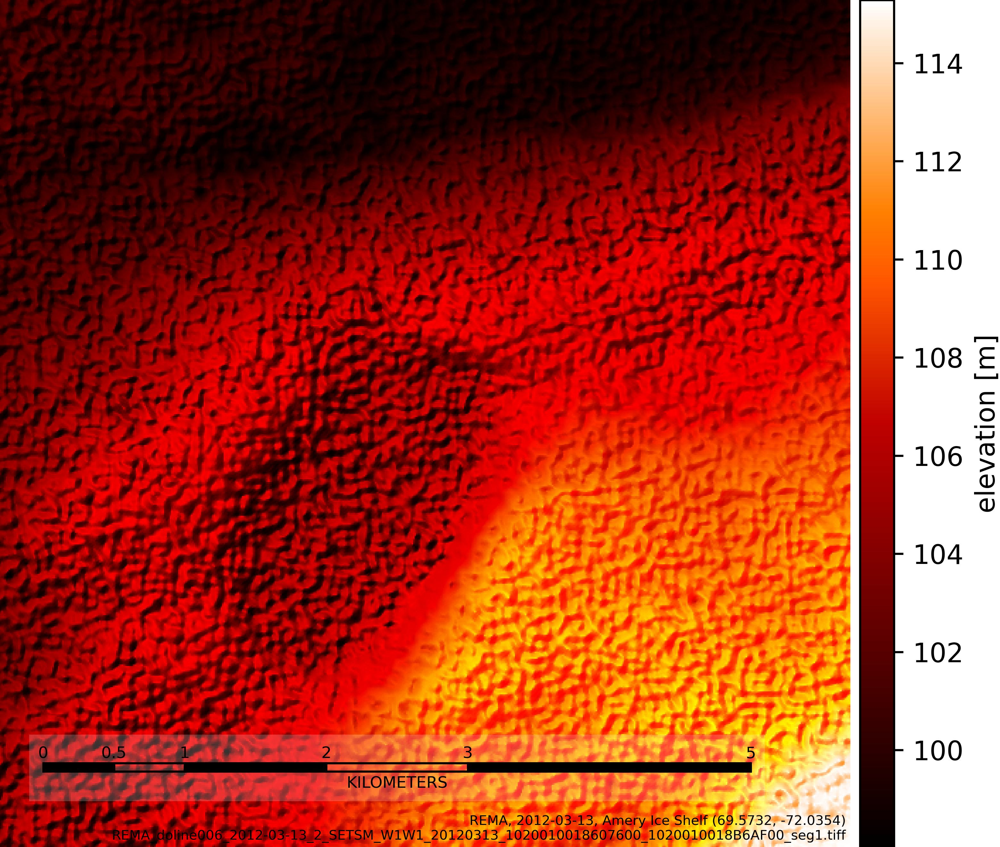

_____________________________________________________________________________

REMA_doline006_2012-03-18_2_SETSM_WV01_20120318_102001001BB38E00_102001001B65DE00_seg1.tiff


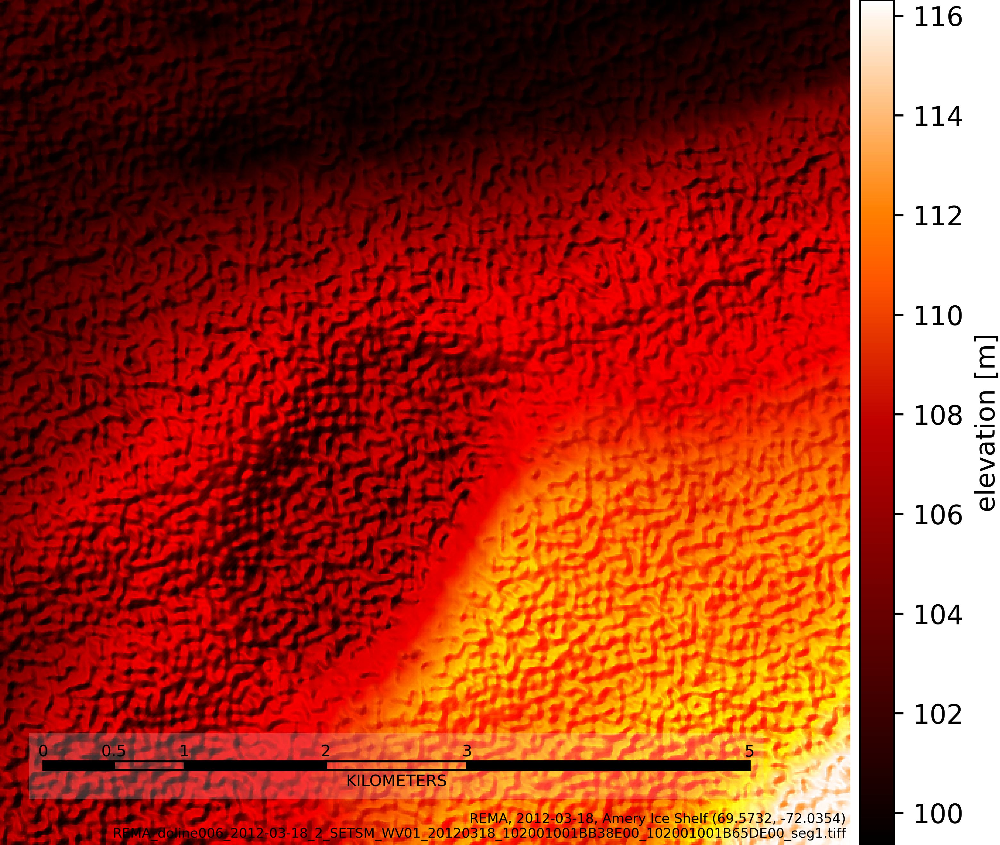

_____________________________________________________________________________

REMA_doline006_2012-12-07_2_SETSM_WV02_20121207_103001001D7FB600_103001001D0A0800_seg1.tiff


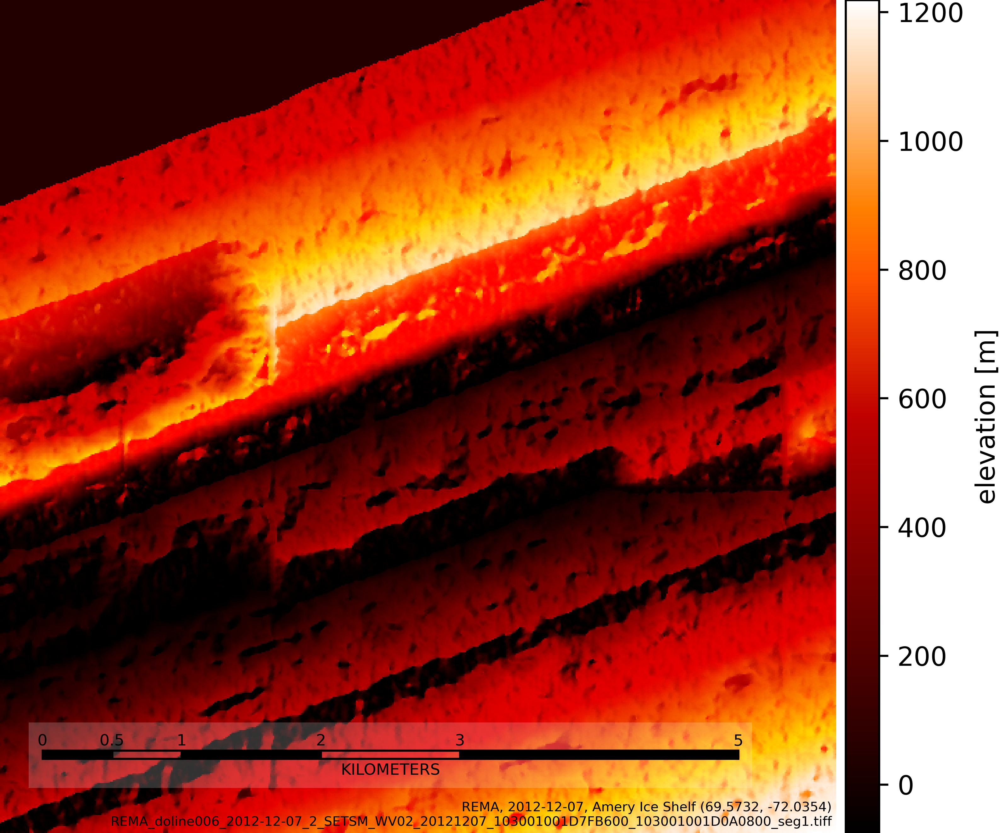

_____________________________________________________________________________

REMA_doline006_2014-02-11_2_SETSM_WV02_20140211_103001002CC92100_103001002D5CAA00_seg1.tiff


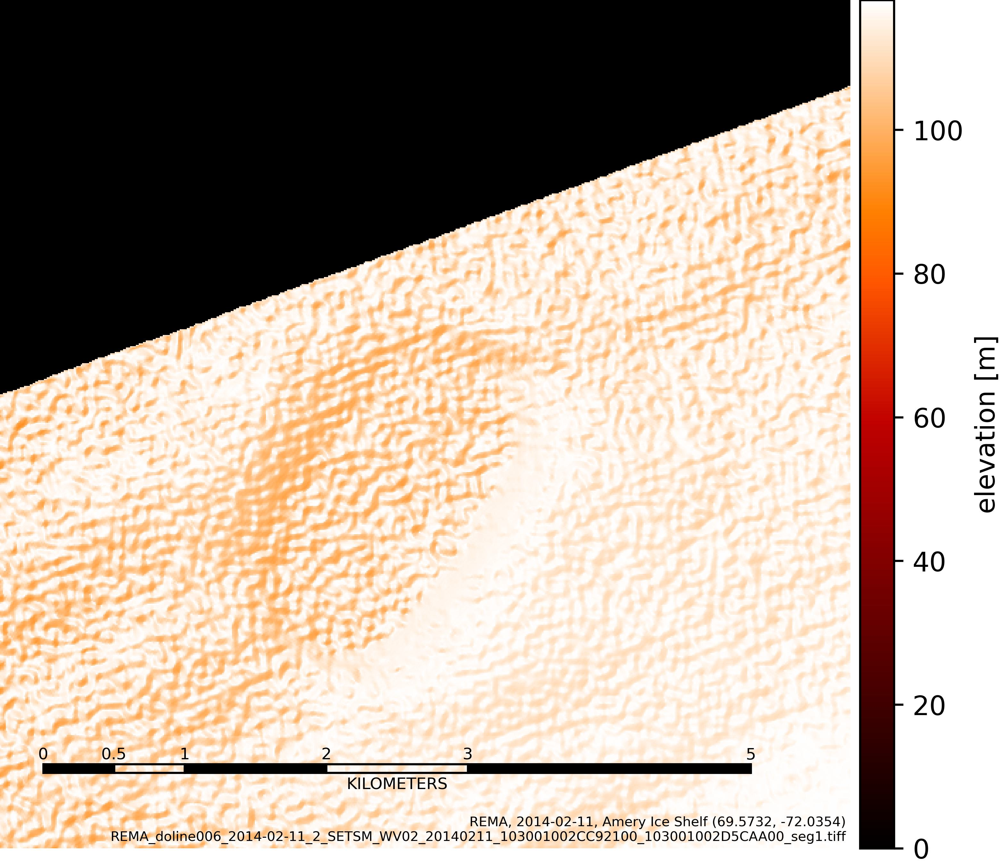

_____________________________________________________________________________

REMA_doline006_2014-02-16_2_SETSM_WV02_20140216_103001002C83C400_103001002E62CA00_seg1.tiff


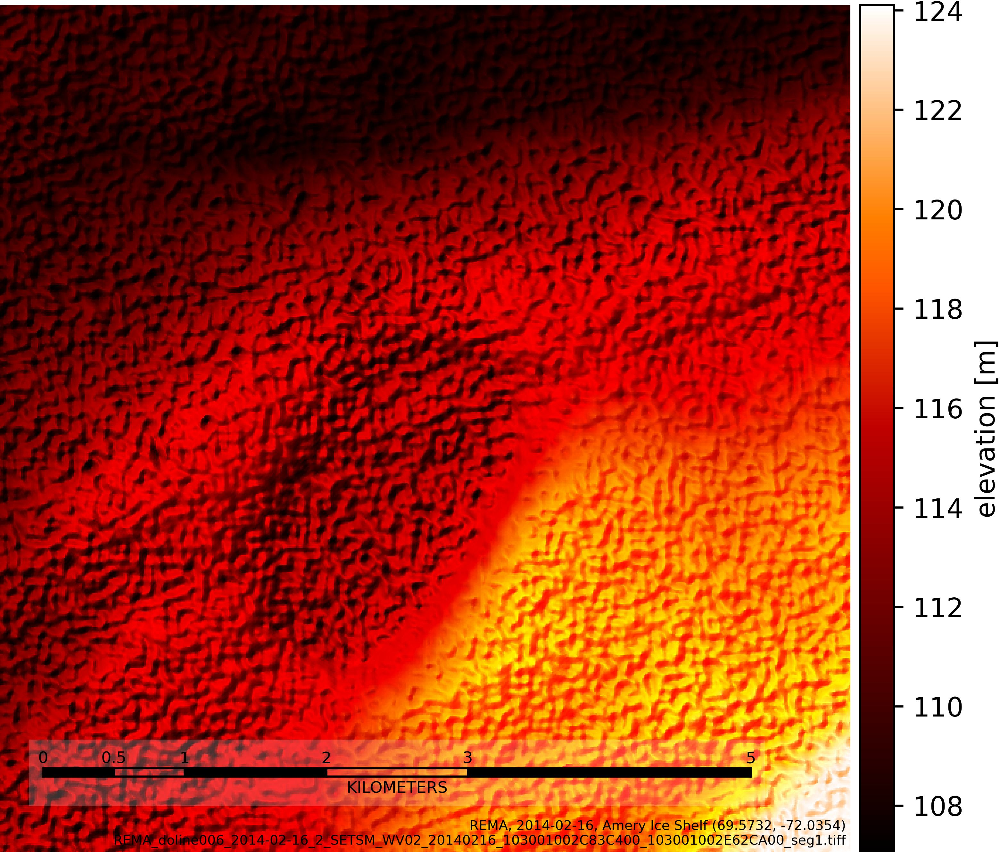

_____________________________________________________________________________

REMA_doline006_2014-02-16_1_SETSM_WV01_20140216_1020010029D82A00_10200100286B9500_seg2.tiff


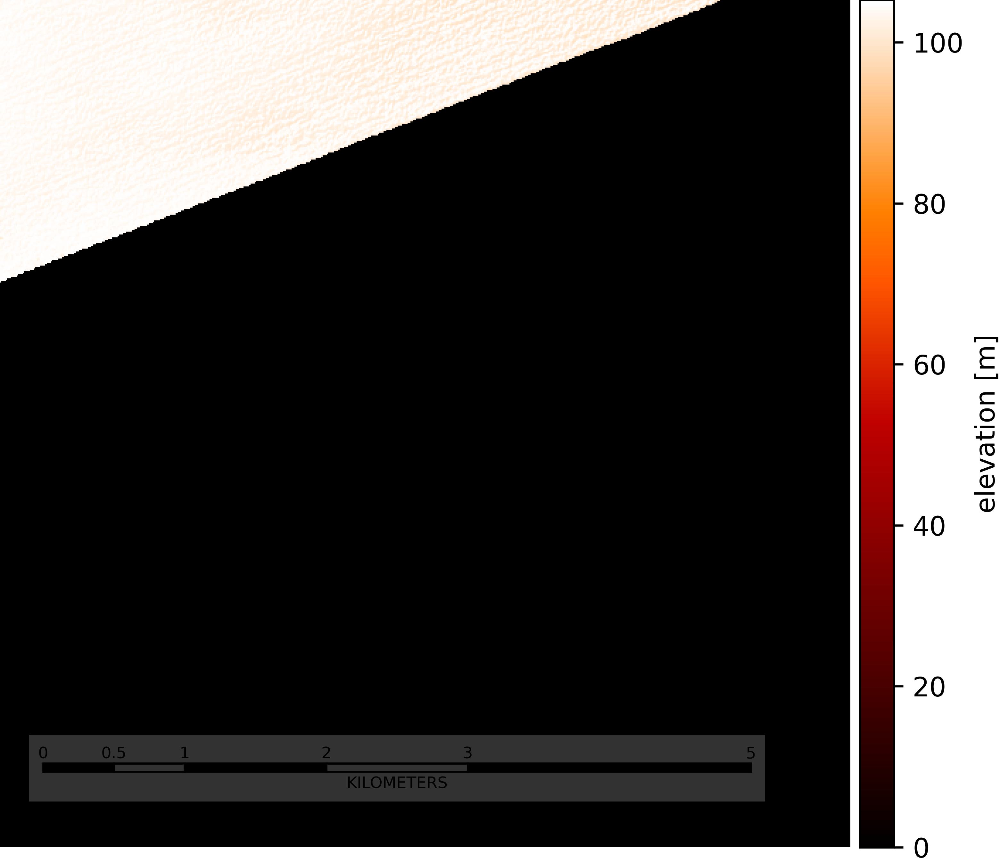

_____________________________________________________________________________

REMA_doline006_2014-02-19_2_SETSM_WV02_20140219_103001002DA1EB00_103001002DCE1700_seg1.tiff


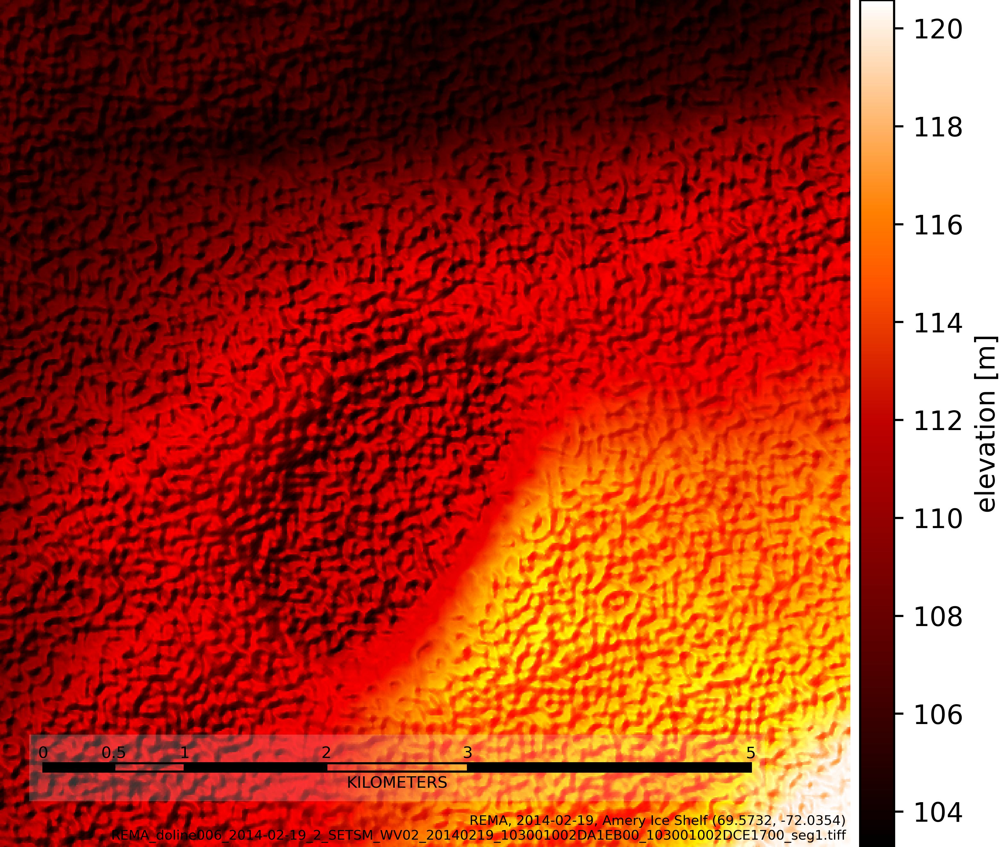

_____________________________________________________________________________

REMA_doline006_2014-03-02_2_SETSM_WV02_20140302_103001002EB86900_103001002D317400_seg1.tiff


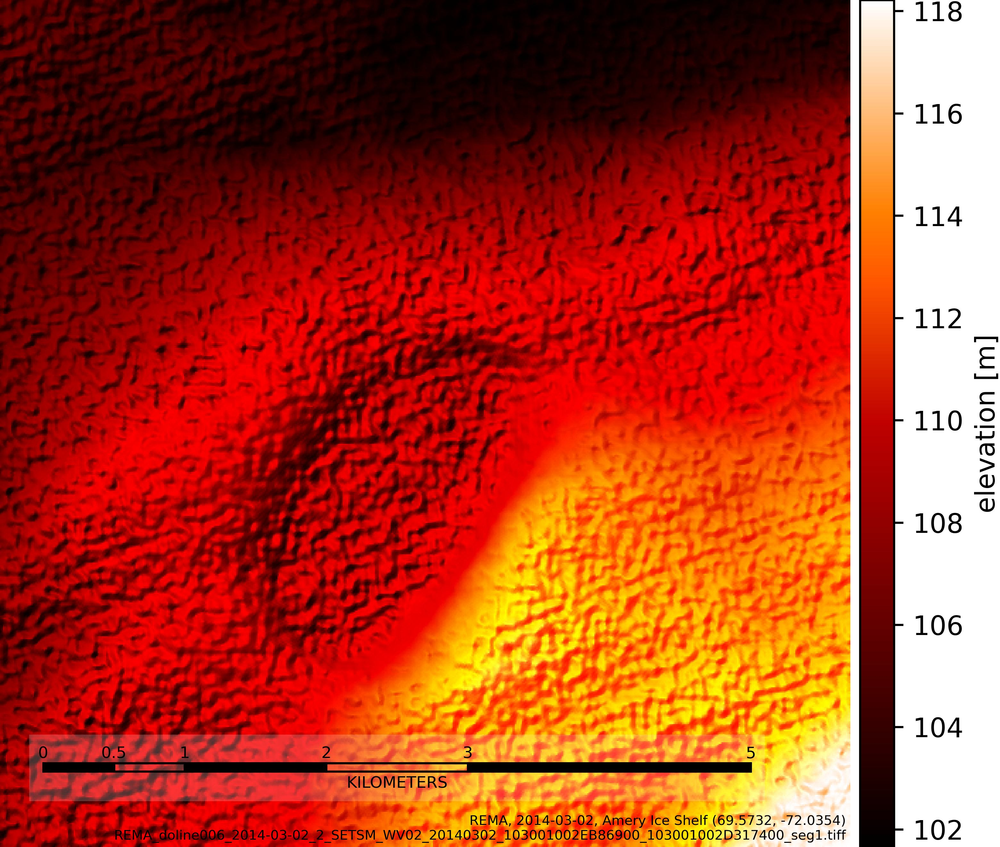

_____________________________________________________________________________

REMA_doline006_2015-09-11_1_SETSM_WV02_20150911_1030010049853400_1030010049D79C00_seg8.tiff


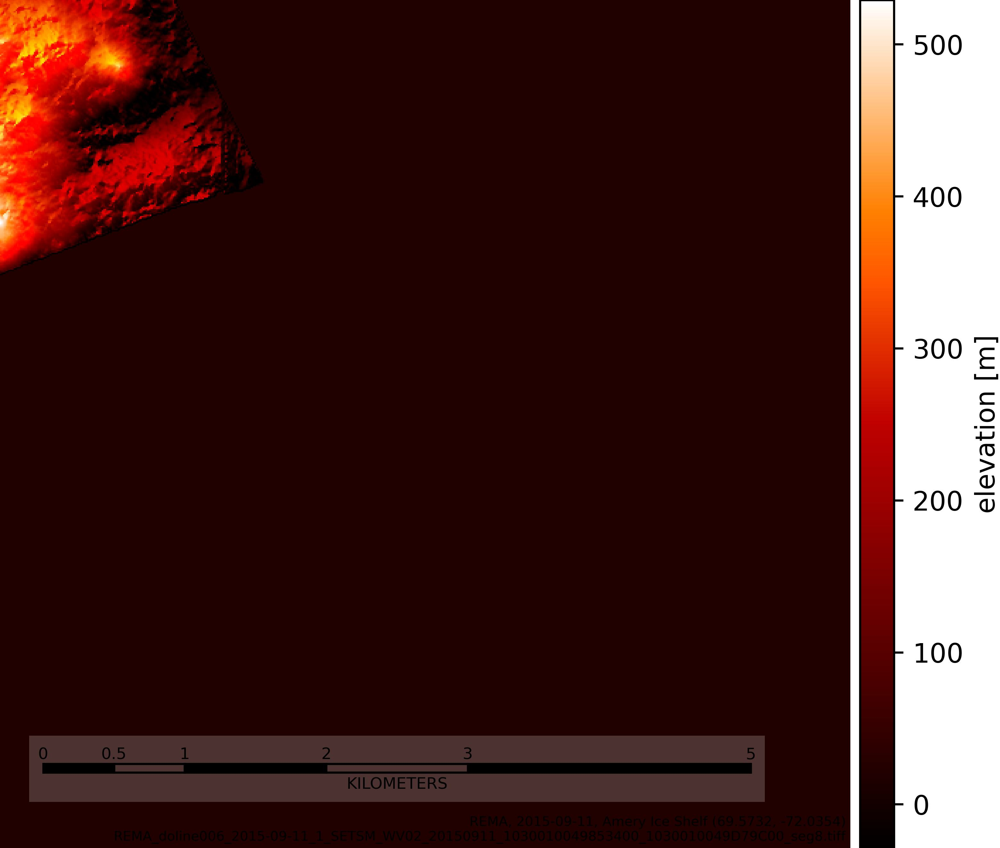

_____________________________________________________________________________

REMA_doline006_2015-09-11_1_SETSM_WV02_20150911_1030010049853400_1030010049D79C00_seg10.tiff


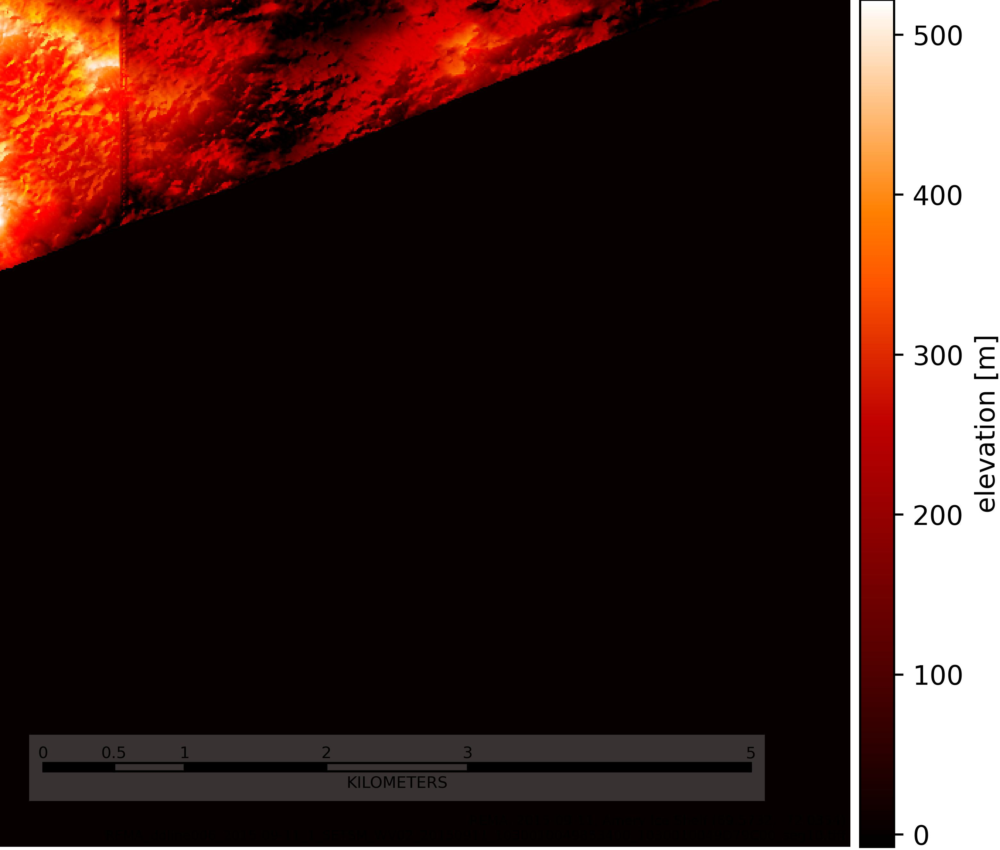

_____________________________________________________________________________

REMA_doline006_2015-09-25_2_SETSM_WV02_20150925_103001004A6B0F00_103001004A49DC00_seg6.tiff


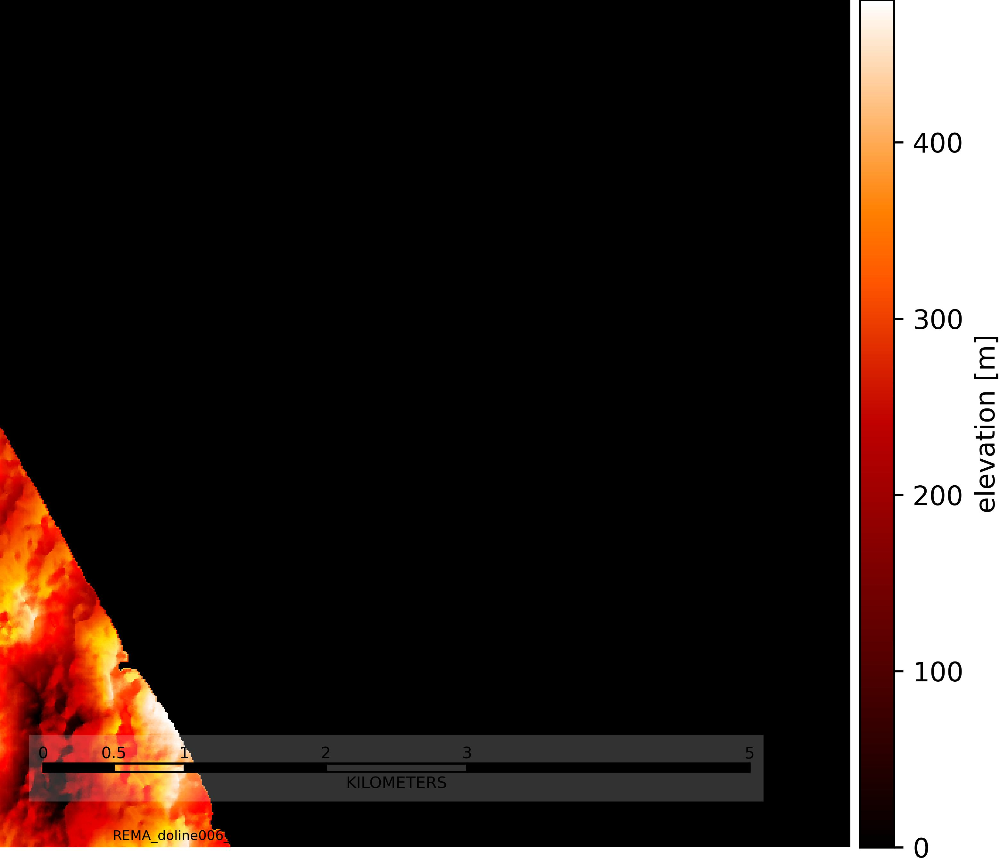

_____________________________________________________________________________

REMA_doline006_2015-09-25_2_SETSM_WV02_20150925_103001004A6B0F00_103001004A49DC00_seg7.tiff


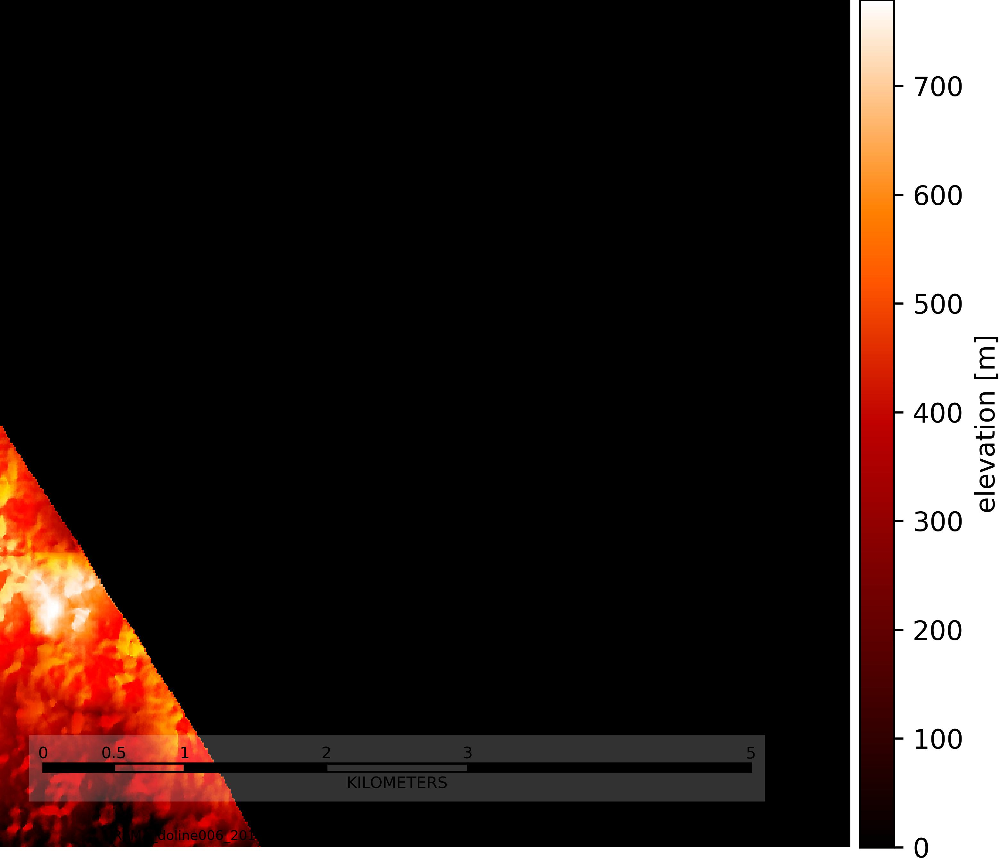

_____________________________________________________________________________

REMA_doline006_2015-09-25_2_SETSM_WV02_20150925_103001004A6B0F00_103001004A49DC00_seg8.tiff


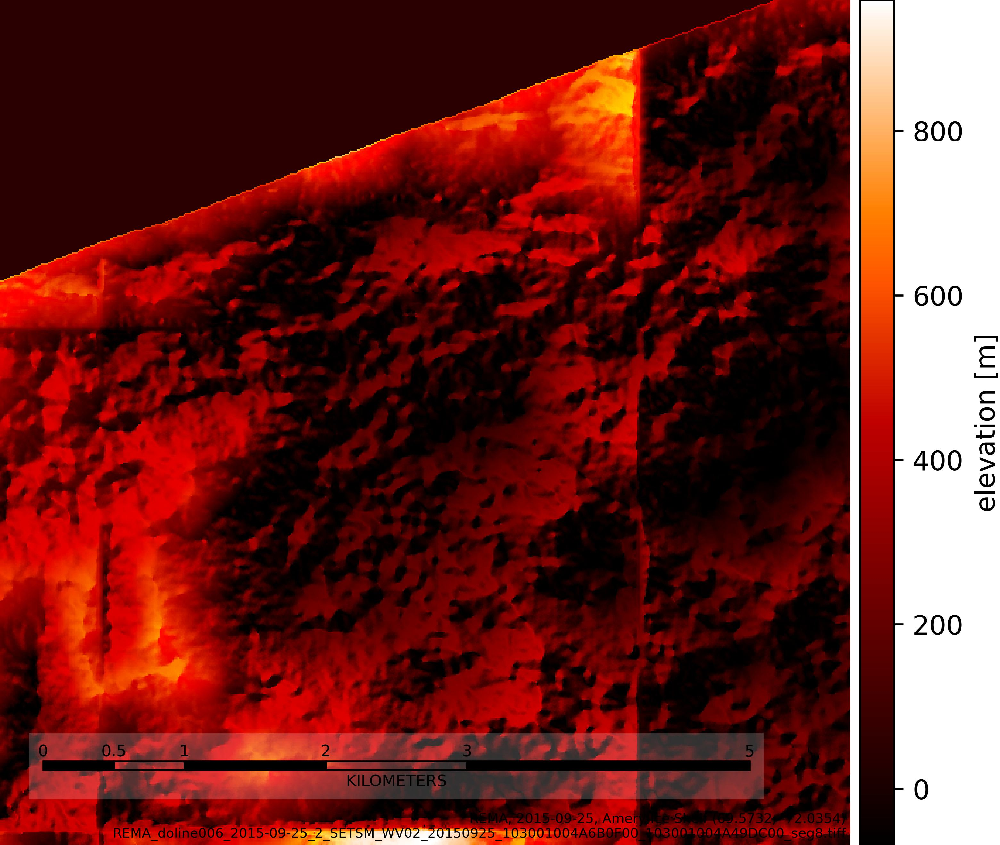

_____________________________________________________________________________

REMA_doline006_2015-09-30_2_SETSM_WV02_20150930_1030010049816C00_10300100496D8100_seg1.tiff


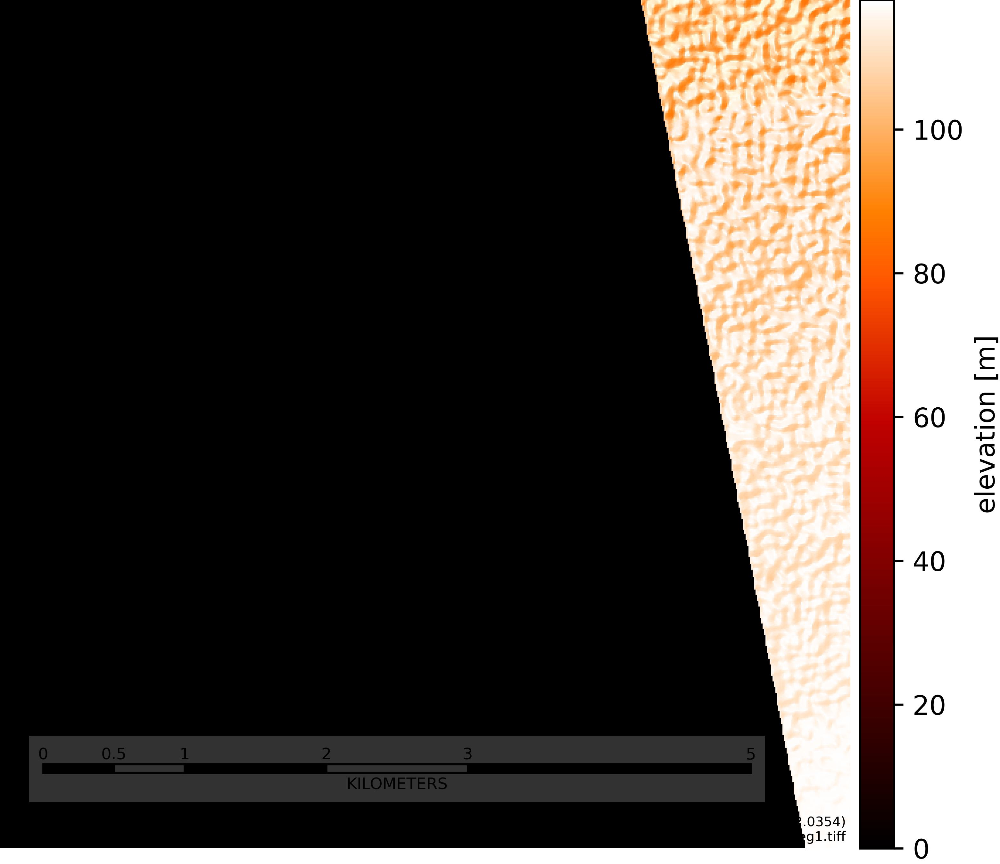

_____________________________________________________________________________

REMA_doline006_2016-12-06_2_SETSM_WV01_20161206_102001005547E000_1020010059AF2400_seg1.tiff


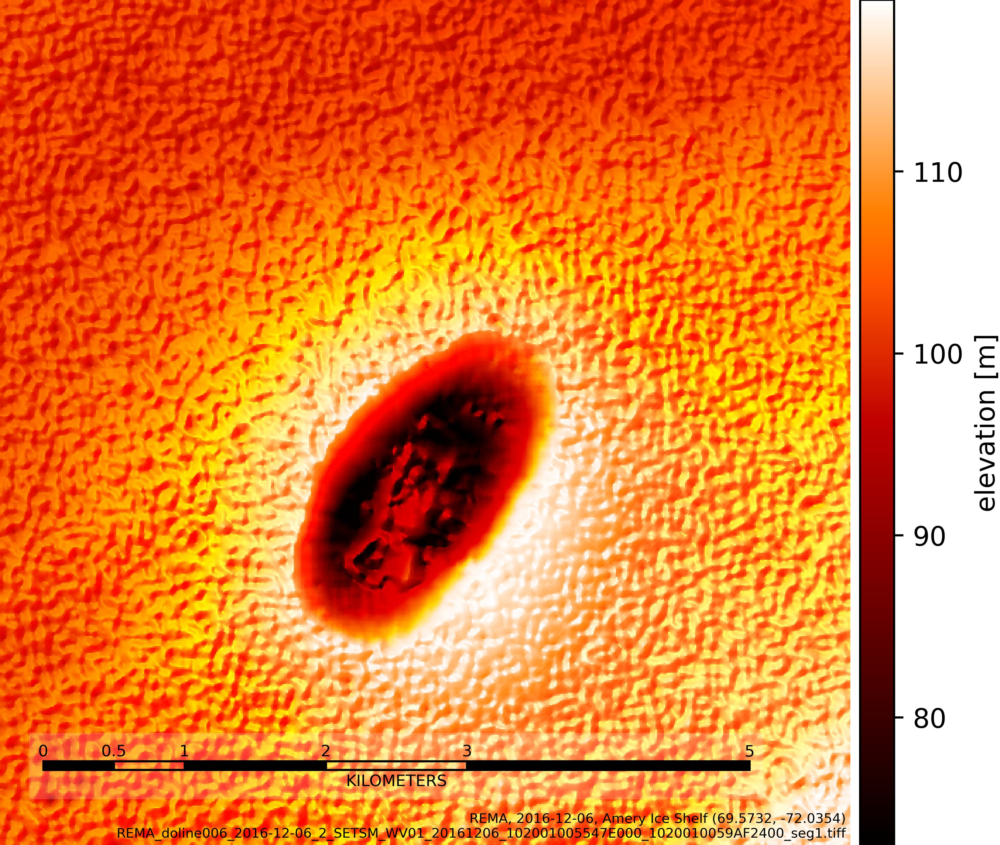

_____________________________________________________________________________

REMA_doline006_2016-12-08_2_SETSM_WV03_20161208_1040010026774900_1040010025AF6900_seg1.tiff


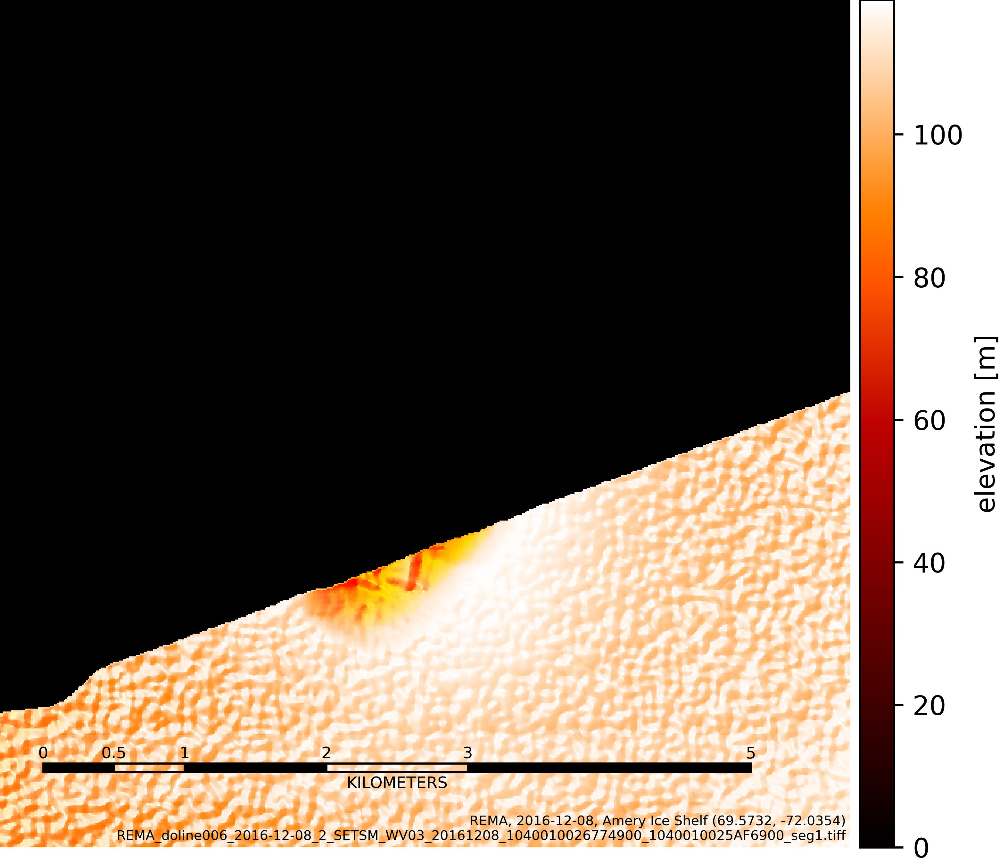

_____________________________________________________________________________

REMA_doline006_2016-12-14_2_SETSM_WV01_20161214_1020010057B65A00_102001005AE32B00_seg1.tiff


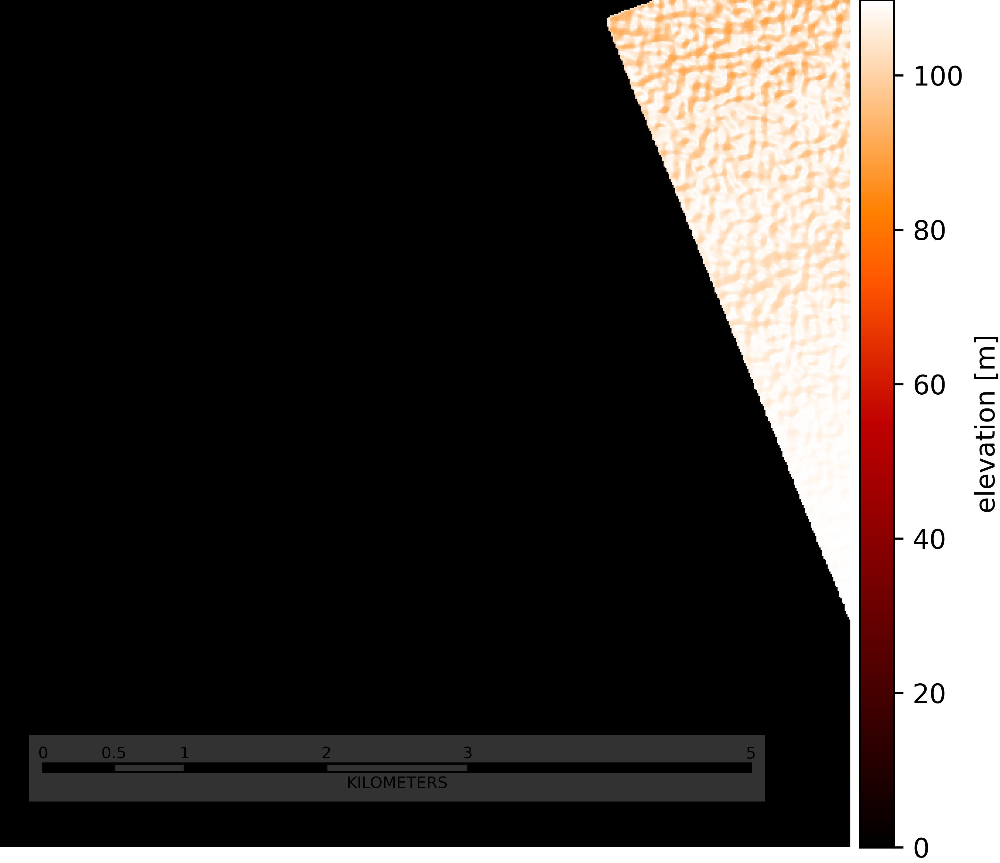

In [39]:
# make the plots
ls = LightSource(azdeg=315, altdeg=45)
# cmap = cmc.roma
cmap = matplotlib.colormaps['gist_heat']
print('  plotted scene (of %d)' % (len(scenedf.iScene)), end=' --> ')
show_plots = False
for j, fn in enumerate(scenedf.fn):
# for j, fn in enumerate([scenedf.fn.iloc[0]]):
    try:
        # load data for rgb composite
        pxl_size = np.abs(scenedf.crs_transform.iloc[j][0])
        pxl_size = 10
        rema_data = rio.open(download_folder_scenes+scenedf.fn.iloc[j])
        imarray = rema_data.read(1)
        imarray[imarray==-9999] = np.mean(imarray[imarray!=-9999])
        rgb = ls.shade(imarray, cmap=cmap, blend_mode='overlay',vert_exag=300, dx=pxl_size, dy=pxl_size)
        
        # produce the figure
        print('_____________________________________________________________________________')
        print('')
        print(fn)
        fig = plt.figure(figsize=[6,6],dpi=100)
        ax = fig.add_subplot(1,1,1)
        implot = ax.imshow(rgb)
        ax.axis('off')
        
        # add info about the data to the plot
        description = 'REMA, %s, %s (%.4f, %.4f)\n%s'%(scenedf.date_string.iloc[j],
                                                         location,
                                                         center_lon,
                                                         center_lat,
                                                         scenedf.fn.iloc[j])
#         ax.text(0.5, 0.97, description, transform = ax.transAxes, fontsize=12, 
#                 verticalalignment='top', horizontalalignment='center',
#                 bbox=dict(facecolor='white', alpha=0.5))
        ax.text(0.995, 0.005, description, transform = ax.transAxes, fontsize=5,
                verticalalignment='bottom', horizontalalignment='right', color='black')
                # bbox=dict(facecolor='white', alpha=0.3, edgecolor=(1,1,1,0)))
        
        # scale bar for main image
        h_fig = np.shape(imarray)[0]
        w_fig = np.shape(imarray)[1]
        bar_len = 5
        margin = 0.07
        xst = w_fig * 0.05
        yst = h_fig * (1-0.1)
        hsc = h_fig*0.01
        lwsc = 0.8
        ticks_km = np.array([0.1, 0.2, 0.3, 0.5, 1, 2, 3, 5, 10, 20, 30, 50])
        ticks_km = ticks_km[ticks_km < (w_fig*pxl_size/1e3*0.9)]
        ticks_km = ticks_km[-5:]
        ticks_km = np.insert(ticks_km,0,0)
        
        scticks = ticks_km * 1e3 / pxl_size
        
        ax.plot([xst, xst+scticks[-1]], [yst, yst], 'k-', lw=lwsc, solid_capstyle='butt')
        ax.plot([xst, xst+scticks[-1]], [yst+hsc, yst+hsc], 'k-', lw=lwsc, solid_capstyle='butt')
        ax.text(xst + 0.5*scticks[-1], yst+1.5*hsc, 'KILOMETERS', fontsize=6,  horizontalalignment='center', verticalalignment='top')
        for i,d in enumerate(scticks):
            sc_ticklabel = ticks_km[i]
            ax.plot([xst+d, xst+d], [yst,yst+hsc], 'k-',lw=lwsc, solid_capstyle='projecting')
            ax.text(xst+d, yst-hsc*0.2, '%g' % (sc_ticklabel), fontsize=6, horizontalalignment='center', verticalalignment='bottom')
            if (i % 2 == 0) & (i+1 < len(scticks)):
                ax.plot([xst+d, xst+scticks[i+1]], [yst+hsc/2, yst+hsc/2], 'k-', lw=lwsc*4, solid_capstyle='butt')
                
        pad = 10
        left = xst - pad
        right = xst + bar_len * 1e3 / pxl_size + pad
        bottom = yst + 27
        top = yst - 20
        width = right-left
        height = top-bottom
        rect=mpatches.Rectangle((left,bottom),width,height, facecolor=(1,1,1,0.2), edgecolor=(1,1,1,0))
        ax.add_patch(rect)
        
        divider = make_axes_locatable(ax)
        cax = divider.append_axes('right', size='4%', pad=0.05)
        norm = matplotlib.colors.Normalize(vmin=np.min(imarray), vmax=np.max(imarray))
        cbar = fig.colorbar(matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap), cax=cax, orientation='vertical')
        cbar.set_label('elevation [m]')

        # matplotlib.colorbar.ColorbarBase(cax=cax, cmap=cmap,norm=norm, orientation='vertical')
        
        # save figure
        if not os.path.exists(fig_dir): os.makedirs(fig_dir)
        figname = fig_dir + scenedf.fn.iloc[j].replace('.tiff', '.jpg')
        plt.savefig(figname, dpi=600, bbox_inches='tight', pad_inches=0)
        display(Image(figname, width=500))
        if not show_plots:
            plt.close()

        # print('%d'%(j+1),end=' ')

    except Exception as e:
        print(e)

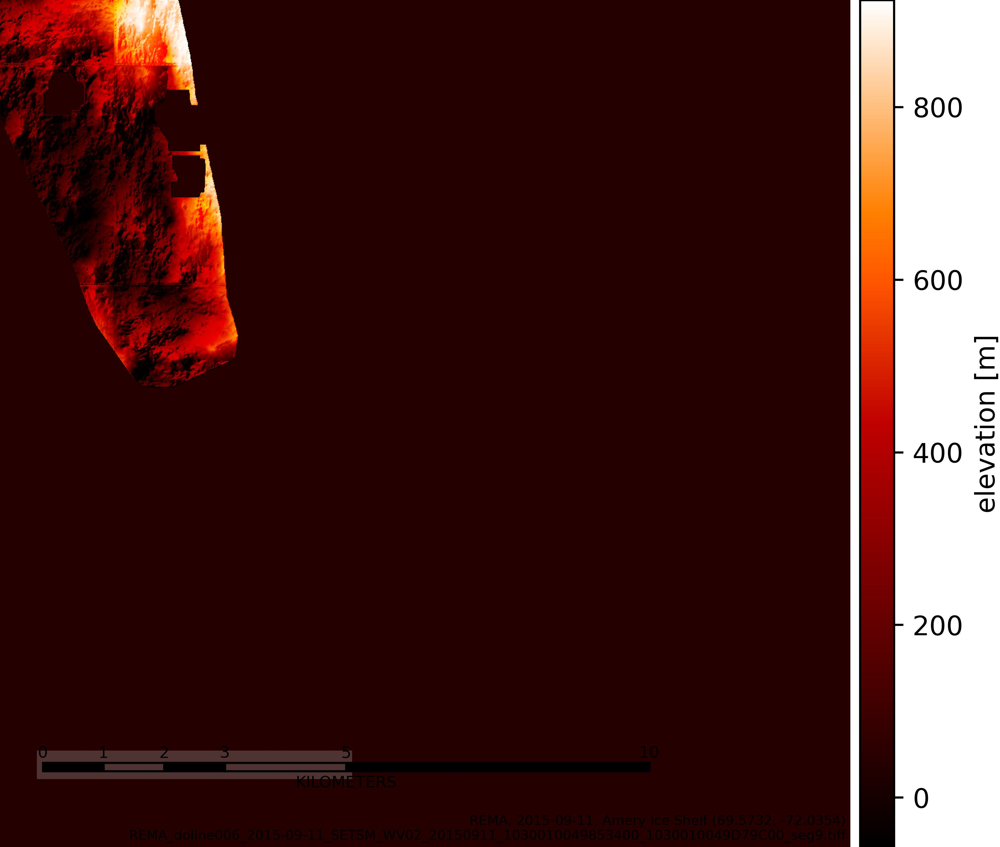

In [17]:
Image(figname)

(-0.5, 2984.5, 3008.5, -0.5)

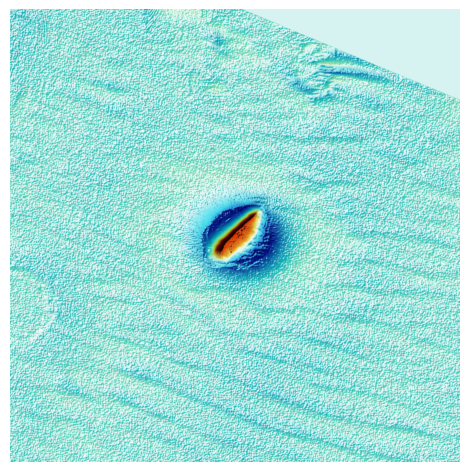

In [11]:
bef = 6
aft = 4
rema_data_1 = rio.open(download_folder_scenes+scenedf.fn.iloc[bef])
rema_data_2 = rio.open(download_folder_scenes+scenedf.fn.iloc[aft])
imarray1 = rema_data_1.read(1)
imarray2 = rema_data_2.read(1)
imarray1[imarray1==-9999] = np.nan
imarray2[imarray2==-9999] = np.nan
imarray = imarray2 - imarray1
imarray = imarray - np.nanmean(imarray)
imarray[np.isnan(imarray)] = 0
fig = plt.figure(figsize=[6,6],dpi=100)
ax = fig.add_subplot(1,1,1)
modes = ['hsv', 'overlay', 'soft']
rgb = ls.shade(imarray, cmap=cmap, blend_mode=modes[1],vert_exag=300, dx=2, dy=2)
implot = ax.imshow(rgb)
ax.axis('off')